In [1]:
import sys
import pathlib
sys.path.append(str(pathlib.PurePath(pathlib.Path.cwd().parent)))

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

import dimod
import dwave
import dwave.system
from dwave.system import DWaveSampler, EmbeddingComposite, FixedEmbeddingComposite
import dwave.inspector
import dwave_networkx as dnx
import minorminer
import embera

from src.particle_funcs import distance_matrix as distance_matrix
import src.leap_funcs.qubo.q_matrix as q_matrix

from src import h5py_funcs
from src.h5py_funcs import discoveries, init_custom_getstates, io

In [2]:
with h5py.File('test.h5', 'r') as f:
    h5py_funcs.discoveries.discover_hdf5_file_structure(f, print_dataset_values=False)

Filename:  test.h5
 - composite   <HDF5 group "/composite" (7 members)>
 - embedding   <HDF5 group "/embedding" (25 members)>
 - group   <HDF5 group "/group" (1 members)>
 - group2   <HDF5 group "/group2" (2 members)>
 - group3   <HDF5 group "/group3" (1 members)>
 - group4   <HDF5 group "/group4" (2 members)>
 - particles   <HDF5 group "/particles" (2 members)>
 - sampler   <HDF5 group "/sampler" (10 members)>
 - sampleset   <HDF5 group "/sampleset" (0 members)>
 - sampleset_sa   <HDF5 group "/sampleset_sa" (11 members)>
 - test   <HDF5 dataset "test": shape (100, 100), type "<f8">

 - Group: /composite
 | - No attributes
 | - Group: /composite/children
 | | - No attributes
 | | - Group: /composite/children/child_0
 | | | - No attributes
 | | | - Group: /composite/children/child_0/_adjacency
 | | | | - No attributes
 | | | | - Dataset: /composite/children/child_0/_adjacency/100
 | | | |   - No attributes
 | | | |   - shape:  (11,)
 | | | |   - size:   11
 | | | |   - ndim:   1
 | | | 

[1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 1.]


C:\Users\oahre\AppData\Local\Temp\ipykernel_2044\795228763.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig_initial.show()


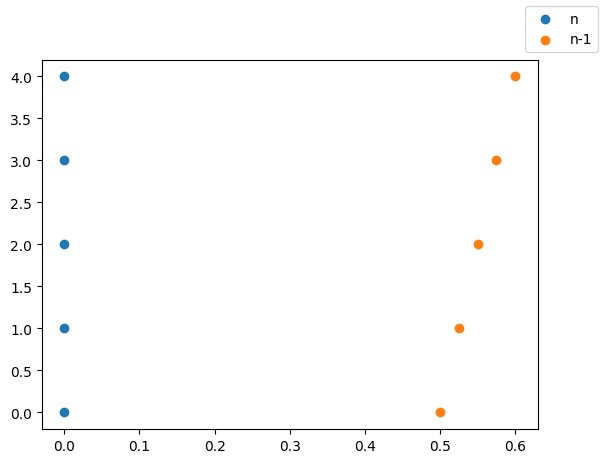

In [3]:
num_particles = 5

part_coords_n = np.zeros((num_particles,2))
part_coords_nm1 = np.zeros((num_particles,2))

for i in range(np.shape(part_coords_n)[0]):
    part_coords_n[i,:] = [0, i]
    part_coords_nm1[i,:] = [0.5*1+0.025*i, i]

fig_initial, axs_initial = plt.subplots(1,1)
axs_initial.scatter(part_coords_n[:,0], part_coords_n[:,1], label="n")
axs_initial.scatter(part_coords_nm1[:,0], part_coords_nm1[:,1], label="n-1")
fig_initial.legend()
fig_initial.show()

correct_sol = np.zeros(num_particles*num_particles)
for i in range(1, num_particles+1):
    correct_sol[(i-1)*num_particles + i -1] = 1.

print(correct_sol)

In [4]:
distances = distance_matrix.calc_phi_ij(part_coords_n, part_coords_nm1)
Q_dist_diag = q_matrix.q_dist_diag(distances)
Q_part = q_matrix.q_part(np.shape(distances)[0])
Q_pos = q_matrix.q_pos(np.shape(distances)[0])
Q_array = Q_dist_diag + Q_part + Q_pos
Q_dict = q_matrix.Q_convert_to_dict(Q_array)
with np.printoptions(precision=3, linewidth=1000, threshold=1e6):
    print(Q_array)

[[-1.5    4.     4.     4.     4.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.   ]
 [ 0.    -0.871  4.     4.     4.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.   ]
 [ 0.     0.     0.074  4.     4.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.   ]
 [ 0.     0.     0.     1.055  4.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.   ]
 [ 0.     0.     0.     0.     2.045  0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.     0.     0.     0.     0.     4.   ]
 [ 0.     0.     0.     0.     0.    -0.882  4.     4.     4.     4.     4.     0.     0.     0.     0.     4.

In [5]:
with open('../API_Token_Oliver_Dev.txt') as file:
    token = file.readline().rstrip()
    architecture = file.readline().rstrip()

sampler = DWaveSampler(token = token, architecture='pegasus', region='eu-central-1')
#EmbeddingComposite(sampler) # required for sampler having all data needed for __getstate__, no idea why this is necessary
tmp_can_be_removed_ = sampler.adjacency
sampler_graph = sampler.to_networkx_graph()

In [6]:
discoveries.discover_obj_data_for_hdf5(sampler.__getstate__())

 <class 'dict'>
 | - failover : False <class 'bool'>
 | - retry_interval : -1 <class 'int'>
 | - _solver_penalty <class 'collections.defaultdict'>
 | | - This dict is empty.
 | - client <class 'dict'>
 | | - config <class 'dict'>
 | | | - metadata_api_endpoint : https://cloud.dwavesys.com/metadata/v1/ <class 'str'>
 | | | - region : eu-central-1 <class 'str'>
 | | | - leap_api_endpoint : https://cloud.dwavesys.com/leap/api/ <class 'str'>
 | | | - endpoint : https://eu-central-1.cloud.dwavesys.com/sapi/v2/ <class 'str'>
 | | | - leap_client_id : None <class 'NoneType'>
 | | | - client : base <class 'str'>
 | | | - solver <class 'dict'>
 | | | | - order_by : -num_active_qubits <class 'str'>
 | | | - polling_schedule <class 'dict'>
 | | | | - backoff_min : 0.05 <class 'float'>
 | | | | - backoff_max : 60.0 <class 'float'>
 | | | | - backoff_base : 1.3 <class 'float'>
 | | | - polling_timeout : None <class 'NoneType'>
 | | | - cert : None <class 'NoneType'>
 | | | - headers <class 'dict'>


In [7]:

# A 16x16 grid problem graph
Sg = nx.grid_2d_graph(16, 16)
S_edgelist = list(Sg.edges())
# Layout of the problem graph
layout = {v:v for v in Sg}
print(S_edgelist)
print(layout)

# The corresponding graph of the D-Wave 2000Q annealer
Tg = embera.utilities.architectures.generators.dw2000q_graph()
# or other graph architectures
# Tg = generators.p16_graph()
T_edgelist = list(Tg.edges())
print(T_edgelist)

candidates = embera.preprocess.diffusion_placer.find_candidates(S_edgelist, Tg, layout=layout)
for key, value in candidates.items():
    print(key, value)
emb = minorminer.find_embedding(S_edgelist, Tg, initial_chains=candidates)

[((0, 0), (1, 0)), ((0, 0), (0, 1)), ((0, 1), (1, 1)), ((0, 1), (0, 2)), ((0, 2), (1, 2)), ((0, 2), (0, 3)), ((0, 3), (1, 3)), ((0, 3), (0, 4)), ((0, 4), (1, 4)), ((0, 4), (0, 5)), ((0, 5), (1, 5)), ((0, 5), (0, 6)), ((0, 6), (1, 6)), ((0, 6), (0, 7)), ((0, 7), (1, 7)), ((0, 7), (0, 8)), ((0, 8), (1, 8)), ((0, 8), (0, 9)), ((0, 9), (1, 9)), ((0, 9), (0, 10)), ((0, 10), (1, 10)), ((0, 10), (0, 11)), ((0, 11), (1, 11)), ((0, 11), (0, 12)), ((0, 12), (1, 12)), ((0, 12), (0, 13)), ((0, 13), (1, 13)), ((0, 13), (0, 14)), ((0, 14), (1, 14)), ((0, 14), (0, 15)), ((0, 15), (1, 15)), ((1, 0), (2, 0)), ((1, 0), (1, 1)), ((1, 1), (2, 1)), ((1, 1), (1, 2)), ((1, 2), (2, 2)), ((1, 2), (1, 3)), ((1, 3), (2, 3)), ((1, 3), (1, 4)), ((1, 4), (2, 4)), ((1, 4), (1, 5)), ((1, 5), (2, 5)), ((1, 5), (1, 6)), ((1, 6), (2, 6)), ((1, 6), (1, 7)), ((1, 7), (2, 7)), ((1, 7), (1, 8)), ((1, 8), (2, 8)), ((1, 8), (1, 9)), ((1, 9), (2, 9)), ((1, 9), (1, 10)), ((1, 10), (2, 10)), ((1, 10), (1, 11)), ((1, 11), (2, 11)

In [8]:
# minorminer

embedding_mm = minorminer.find_embedding(S=Q_dict, T=sampler_graph, interactive=True, verbose=1)
print(type(embedding_mm))
print(embedding_mm)
print(type([key for key in embedding_mm.keys()][0]))
print(type(embedding_mm[1]))
print(type(embedding_mm[1][0]))

initialized
embedding found.
max chain length 5; num max chains=1
reducing chain lengths
max chain length 4; num max chains=6
max chain length 3; num max chains=14
<class 'dict'>
{1: [2346, 4167, 4062], 2: [2331, 3912, 2330], 3: [2361, 2360, 3852], 4: [4092, 2376, 2466], 5: [4017, 4018], 6: [4063, 2541], 11: [2391, 2390], 16: [4077, 2225, 4078], 21: [4032, 4033], 7: [2434, 2435], 12: [3987, 3988], 17: [2270, 4106, 4107], 22: [4047, 4048, 2300], 8: [2540, 3898, 3897], 13: [3971, 3972, 2210], 18: [2195, 3941], 23: [3882, 2285], 9: [2449, 2450], 14: [2375, 3853], 19: [2405, 3942], 24: [2465, 3883], 10: [4003, 2480], 15: [3957, 2420], 20: [4002, 2255], 25: [2315, 3927]}
<class 'int'>
<class 'list'>
<class 'int'>


In [9]:
#%matplotlib qt5
#fig, axs = plt.subplots(1,1)
#dnx.draw_pegasus_embedding(sampler_graph, emb=candidates, embedded_graph=Sg, with_labels=False, show_labels=False, crosses=True, ax=axs)
#plt.show()

In [10]:
#dnx.drawing.pegasus_layout(sampler_graph)
layout_source = {i: val for i, val in enumerate(part_coords_n)}
layout_source = {}
for i in range(num_particles):
    for j in range(num_particles):
        layout_source[i*num_particles + j +1] = (part_coords_nm1[j,0], part_coords_nm1[j,1])
print(layout_source)

{1: (0.5, 0.0), 2: (0.525, 1.0), 3: (0.55, 2.0), 4: (0.575, 3.0), 5: (0.6, 4.0), 6: (0.5, 0.0), 7: (0.525, 1.0), 8: (0.55, 2.0), 9: (0.575, 3.0), 10: (0.6, 4.0), 11: (0.5, 0.0), 12: (0.525, 1.0), 13: (0.55, 2.0), 14: (0.575, 3.0), 15: (0.6, 4.0), 16: (0.5, 0.0), 17: (0.525, 1.0), 18: (0.55, 2.0), 19: (0.575, 3.0), 20: (0.6, 4.0), 21: (0.5, 0.0), 22: (0.525, 1.0), 23: (0.55, 2.0), 24: (0.575, 3.0), 25: (0.6, 4.0)}


In [11]:
#tries (int, default=1):
#verbose (int, default=0): Verbosity level
#    0: Quiet mode
#    1: Print statements
#    4: Tile drawings with concentrati
#layout ({<node>:(<x>,<y>),...}, default=None):
#    Dict of 2D positions assigned to the source graph node
#vicinity (int, default=3): Granularity of the candidate assignment.
#    0: Single tile
#    1: Immediate neighbors = (north, south, east, west)
#    2: Extended neighbors = (Immediate) + diagonals
#    3: Directed  = (Single) + 3 tiles closest to the node coordinat
#viscosity (float, default=0.00
#delta_t (float, default=0.20): Time delta for every diffusion ste
#d_lim (float<=1.0, default=0.75): Density limity for each til
#downscale (bool, default=False): Scale of initial overlay is calculated
#    from the problem/target size ratio, and expected occupancy _a
#    i.e. (Y,X) = 2 + (M,N)*(P_size*_a/T_size
#keep_ratio (bool or float<=1.0, default=False): When scaling, keep
#    aspect ratio. If a float is given, the value is used to scale
#    the problem layout in the dimension that is not restricted by
#    the target dimension
#expected_occupancy (float, default=2.5): Number of qubits expected
#    to be used per problem node on average.
kwargs_diffusion_candidates = {
    #'tries':1, 
    'verbose':1,
    'layout':layout_source,
    #'vicinity':3,
    #'viscosity':,
    #'delta_t':,
    #'d_lim':,
    #'downscale':,
    #'keep_ratio':,
    #'expected_occupancy':
    }

In [12]:
Q_dict_graph = nx.Graph(list(Q_dict))
Q_dict_edgelist = list(Q_dict_graph.edges())
#Q_dict_edgelist = [(item, item[::-1]) for item in Q_dict_edgelist]
#layout_dummy = {v:v for v in Q_dict_graph.graph}
#layout = dnx.drawing.pegasus_layout(sampler_graph) # x y coordinates of the nodes
#print(Q_dict_graph)
#print(Q_dict_edgelist)
#print(layout)
candidates_em = embera.preprocess.diffusion_placer.find_candidates(Q_dict_edgelist, sampler_graph)#, layout=layout)
candidates_em_wo_migration = embera.preprocess.diffusion_placer.find_candidates(Q_dict_edgelist, sampler_graph, enable_migration=False)#, layout=layout)

candidates_em_layout = embera.preprocess.diffusion_placer.find_candidates(Q_dict_edgelist, sampler_graph, **kwargs_diffusion_candidates)
candidates_em_wo_migration_layout = embera.preprocess.diffusion_placer.find_candidates(Q_dict_edgelist, sampler_graph, enable_migration=False, **kwargs_diffusion_candidates)



d:\onedriverwth\rwth\simulation_sciences\masterthesis\04_code\quantum_annealing_for_particle_matching\ext\embera\embera\preprocess\diffusion_placer.py:34: UserWarning: A spring layout of the unweighted graph was generated using NetworkX.
  warnings.warn("A spring layout of the unweighted graph"


In [13]:
print(len(candidates_em))
print(len(candidates_em_wo_migration))
print(len(candidates_em_layout))
print(len(candidates_em_wo_migration_layout))
for key, value in candidates_em.items():
    print(key, value)

25
25
25
25
1 {1282, 1283, 4356, 1297, 1298, 4371, 1312, 1313, 4386, 4401, 4146, 1087, 4416, 4161, 1088, 1102, 4431, 4176, 1103, 4445, 4446, 4191, 1118, 1117, 4460, 4461, 4206, 1133, 1132, 1146, 4475, 4476, 4221, 1147, 1161, 1162, 4491, 4236, 4490, 1176, 1177, 4251, 1191, 1192, 4265, 4266, 1206, 1207, 4280, 4281, 1221, 1222, 4295, 4296, 1236, 1237, 4310, 4311, 1251, 1252, 4326, 1267, 1268, 4341}
2 {1282, 1283, 4356, 4491, 1297, 1298, 4371, 1312, 1313, 4266, 4146, 1206, 1207, 4281, 4161, 1221, 1222, 4296, 4176, 1236, 1237, 4311, 4446, 4191, 1251, 1252, 4326, 4461, 1267, 1268, 4341, 4476}
3 {4224, 1731, 4419, 1732, 1672, 1673, 4298, 4493, 4239, 4434, 1686, 1687, 4313, 1627, 1628, 4254, 4448, 1701, 4389, 1702, 1642, 1643, 4268, 4463, 4209, 1716, 4404, 1717, 1657, 1658, 4283, 4478}
4 {1536, 1537, 4418, 4163, 4358, 1611, 1612, 4238, 1551, 1552, 4433, 4178, 4373, 4253, 1566, 1567, 4193, 1506, 1507, 4388, 4328, 1581, 1582, 4208, 1521, 1522, 4403, 4148, 4343, 1596, 1597, 4223}
5 {1536, 1537, 4

In [14]:
embedding_em = minorminer.find_embedding(Q_dict, sampler_graph, initial_chains=candidates_em, interactive=True, verbose=1)


initialized
max qubit fill 9; num maxfull qubits=16
embedding trial 1
max qubit fill 8; num maxfull qubits=16
max qubit fill 7; num maxfull qubits=16
max qubit fill 6; num maxfull qubits=15
max qubit fill 5; num maxfull qubits=15
max qubit fill 4; num maxfull qubits=48
max qubit fill 3; num maxfull qubits=47
max qubit fill 2; num maxfull qubits=76
embedding found.
max chain length 53; num max chains=1
reducing chain lengths
max chain length 52; num max chains=1
max chain length 7; num max chains=1
max chain length 6; num max chains=1
max chain length 5; num max chains=2
max chain length 4; num max chains=3


In [15]:
embedding_em_wo_migration = minorminer.find_embedding(Q_dict, sampler_graph, initial_chains=candidates_em_wo_migration, interactive=True, verbose=1)


initialized
embedding found.
max chain length 13; num max chains=2
reducing chain lengths
max chain length 11; num max chains=1
max chain length 7; num max chains=1
max chain length 6; num max chains=4
max chain length 4; num max chains=5


In [27]:
embedding_em_layout = minorminer.find_embedding(Q_dict, sampler_graph, initial_chains=candidates_em_layout, verbose=1)


In [28]:
embedding_em_wo_migration_layout = minorminer.find_embedding(Q_dict, sampler_graph, initial_chains=candidates_em_wo_migration_layout, verbose=1)

In [30]:
#embedding_em_em_wo_migration = embera.disperse.find_embedding(Q_dict_edgelist, sampler_graph, initial_chains=candidates_em_wo_migration, verbose=1)
# Takes forever to run

In [18]:
%matplotlib qt5
kwargs_plot = {'with_labels':False, 'show_labels':False, 'crosses':True}
fig, axs = plt.subplots(1,1)
dnx.draw_pegasus_embedding(sampler_graph, emb=embedding_mm, embedded_graph=Q_dict_graph, **kwargs_plot, ax=axs)
plt.show()

In [19]:
%matplotlib qt5
fig, axs = plt.subplots(1,1)
dnx.draw_pegasus_embedding(sampler_graph, emb=embedding_em, embedded_graph=Q_dict_graph, **kwargs_plot, ax=axs)
plt.show()

In [20]:
%matplotlib qt5
fig, axs = plt.subplots(1,1)
dnx.draw_pegasus_embedding(sampler_graph, emb=embedding_em_wo_migration, embedded_graph=Q_dict_graph, **kwargs_plot, ax=axs)
plt.show()

In [21]:
%matplotlib qt5
fig, axs = plt.subplots(1,1)
dnx.draw_pegasus_embedding(sampler_graph, emb=embedding_em_layout, embedded_graph=Q_dict_graph, **kwargs_plot, ax=axs)
plt.show()

In [22]:
%matplotlib qt5
fig, axs = plt.subplots(1,1)
dnx.draw_pegasus_embedding(sampler_graph, emb=embedding_em_wo_migration_layout, embedded_graph=Q_dict_graph, **kwargs_plot, ax=axs)
plt.show()

In [23]:
composite_2 = FixedEmbeddingComposite(sampler, embedding_em)
num_qubits_comp_2 = len(set(inner for outer in embedding_em.values() for inner in outer))
num_qubits_comp_2

61

In [24]:
print(sampler.properties['annealing_time_range'])
print(sampler.properties['default_annealing_time'])
print(sampler.properties['programming_thermalization_range'])
print(sampler.properties['default_programming_thermalization'])
print(sampler.properties['readout_thermalization_range'])
print(sampler.properties['default_readout_thermalization'])

params = {'label' : 'superdupernice label',
          'annealing_time': 5, 
          'num_reads': 3, 
          'answer_mode': 'raw', 
          'programming_thermalization': 1000, 
          'readout_thermalization': 0}
print(composite_2.child.solver.estimate_qpu_access_time(num_qubits=num_qubits_comp_2, **params))

[0.5, 2000.0]
20.0
[0.0, 10000.0]
1000.0
[0.0, 10000.0]
0.0
14662.878493195889


In [22]:
#sampleset_comp_2 = composite_2.sample_qubo(Q_dict, **params)
#sampleset_comp_2

In [23]:
#discover_obj_data_for_hdf5(sampler)
#discover_obj_data_for_hdf5(sampler.__getstate__())
#discover_obj_data_for_hdf5(composite_2)
#discover_obj_data_for_hdf5(composite_2.__getstate__())
#discover_obj_data_for_hdf5(sampleset_comp_2.to_serializable(pack_samples=False))

In [24]:
test_dict = {'test1': 1, 'test2': 2}
h5py_funcs.io.write_to_hdf5_file(file_name_path='test.h5', dict_data=test_dict, data_name='particles', overwrite_data_in_file=True)

In [25]:
h5py_funcs.io.write_to_hdf5_file(file_name_path='test.h5', dict_data=sampler.__getstate__(), data_name='sampler', overwrite_data_in_file=True)
h5py_funcs.io.write_to_hdf5_file(file_name_path='test.h5', dict_data=composite_2.__getstate__(), data_name='composite', overwrite_data_in_file=True)
h5py_funcs.io.write_to_hdf5_file(file_name_path='test.h5', dict_data=embedding_em, data_name='embedding', overwrite_data_in_file=True)
#h5py_funcs.io.write_to_hdf5_file(file_name_path='test.h5', dict_data=sampleset_comp_2.to_serializable(pack_samples=False), data_name='sampleset', overwrite_data_in_file=True)

In [26]:
with h5py.File('test.h5', 'r') as f:
    h5py_funcs.discoveries.discover_hdf5_file_structure(f, print_dataset_values=False)
    #print(f['/sampler'].keys())
    #f.visit(print)

Filename:  test.h5
 - composite   <HDF5 group "/composite" (7 members)>
 - embedding   <HDF5 group "/embedding" (25 members)>
 - group   <HDF5 group "/group" (1 members)>
 - group2   <HDF5 group "/group2" (2 members)>
 - group3   <HDF5 group "/group3" (1 members)>
 - group4   <HDF5 group "/group4" (2 members)>
 - particles   <HDF5 group "/particles" (2 members)>
 - sampler   <HDF5 group "/sampler" (10 members)>
 - test   <HDF5 dataset "test": shape (100, 100), type "<f8">

 - Group: /composite
 | - No attributes
 | - Group: /composite/children
 | | - No attributes
 | | - Group: /composite/children/child_0
 | | | - No attributes
 | | | - Group: /composite/children/child_0/_adjacency
 | | | | - No attributes
 | | | | - Dataset: /composite/children/child_0/_adjacency/100
 | | | |   - No attributes
 | | | |   - shape:  (11,)
 | | | |   - size:   11
 | | | |   - ndim:   1
 | | | |   - dtype:  int32
 | | | |   - nbytes: 44
 | | | |     <HDF5 dataset "100": shape (11,), type "<i4">
 | | | | -